# Composite Analysis and Maps in Giovanni
***

### This feature would users who are interested in studying the enviroment surrounding a particular phenomena. An example might be what does the surface pressure from MERRA-2 look like for the 10 rainiest days in Seattle, WA since 1980. 

### This would be a great Giovanni feature to allow users to explore patterns that occur discontinuously in time and give a whole new dimension to what users can explore. 

#### In this notebook we explore the impacts of El Nino and La Nina on the 2-m Air Temperatures from MERRA-2. The impact of the El Nino Southern Oscillation (ENSO) on near surface temperature is most impactful during the winter. We can demonstrate this by computing the composite mean of February Monthly 2-m Temperatures from MERRA-2 averaging just the February temperatures for strong El Nino years. We can similarly do this for La Nina to see how winter temperature patterns differ.

##### For some bonus content and extra credit, MERRA-2 has a considerable length of record (1980-2025) and we can look at the years where ENSO is neutral, to look at the temperature anomaly for El Nino and La Nina when compared to normal conditions. 
***

### This notebook requires the following python packages and their dependencies installed via conda-forge. 

__Required:__
- numpy
- xarray
- matplotlib
- glob (for gathering list of .nc4 files)

___Used for Plotting (Optional):___
- cmaps (NCL Colormaps)
- cartopy

#### GES DISC Data Used in Example

In this example we use 45 Years (1980-2024) of Monthly MERRA-2 2-m Air Temperature  downloaded using from the [M2TMNXSLV_5.12.4 dataset](https://disc.gsfc.nasa.gov/datasets/M2TMNXSLV_5.12.4/summary) landing page.

We subset the Monthly Data by accessing the [dataset landing page](https://disc.gsfc.nasa.gov/datasets/M2TMNXSLV_5.12.4/summary) and subset via OPeNDAP using a bounding box of (-127.97,25.17,-66.97,50.83) and then download using one of the options from the [GES DISC Data Access FAQ](https://disc.gsfc.nasa.gov/information/howto?title=How%20to%20Access%20GES%20DISC%20Data%20Using%20wget%20and%20curl). 

***

##### Importing Libraries

In [1]:
import glob
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cmaps
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

##### Gather List of Monthly Data Files and Open in Xarray

In [2]:
# Gathering Data Files for MERRA-2 Monthly 2m Air T (1980-2024)
air_T2m_files = glob.glob('C:/Users/bomitch1/Downloads/Giovanni_Stats_Examples/4/M2TMNXSLV.5.12.4%3AMERRA2_*.nc4')

# Opening Dataset into Xarray
T2m = xr.open_mfdataset(air_T2m_files)['T2M']
print(T2m)

<xarray.DataArray 'T2M' (time: 540, lat: 53, lon: 99)> Size: 11MB
dask.array<concatenate, shape=(540, 53, 99), dtype=float32, chunksize=(1, 53, 99), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 792B -128.1 -127.5 -126.9 ... -68.12 -67.5 -66.88
  * time     (time) datetime64[ns] 4kB 1980-01-01T00:30:00 ... 2024-12-01T00:...
  * lat      (lat) float64 424B 25.0 25.5 26.0 26.5 27.0 ... 49.5 50.0 50.5 51.0
Attributes:
    long_name:       2-meter_air_temperature
    units:           K
    fmissing_value:  1000000000000000.0
    vmax:            1000000000000000.0
    vmin:            -1000000000000000.0
    valid_range:     [-1.e+15  1.e+15]


##### The idea is to explore Winter time impacts of ENSO so we will look at just February months

In [3]:
# Selecting February Months
T2m_F = T2m.sel(time=T2m['time.month'] ==2)
print(T2m_F)

<xarray.DataArray 'T2M' (time: 45, lat: 53, lon: 99)> Size: 944kB
dask.array<getitem, shape=(45, 53, 99), dtype=float32, chunksize=(1, 53, 99), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 792B -128.1 -127.5 -126.9 ... -68.12 -67.5 -66.88
  * time     (time) datetime64[ns] 360B 1980-02-01T00:30:00 ... 2024-02-01T00...
  * lat      (lat) float64 424B 25.0 25.5 26.0 26.5 27.0 ... 49.5 50.0 50.5 51.0
Attributes:
    long_name:       2-meter_air_temperature
    units:           K
    fmissing_value:  1000000000000000.0
    vmax:            1000000000000000.0
    vmin:            -1000000000000000.0
    valid_range:     [-1.e+15  1.e+15]


##### Here's where the Composite Analysis starts. 

**Users in theory would be able to select which __month__ _and/or_ __year__ they would like to __composite__ together.**

A link to the list of years of El Nino, La Nina, and Neutral phases from NOAA's Physical Sciences Laboratory can be found [here](https://psl.noaa.gov/enso/past_events.html). We use the years since 1980 since that's the beginning date for the MERRA-2 dataset. 

In [4]:
# Selecting El Nino years
El_Nino_Years = [1980 , 1983 , 1987 , 1988 , 1992 , 1995 , 1998 , 2003 , 2007 , 2010 , 2016]

# We create a mask for the February Months that are not associated with El Nino years and create a new data array
El_Nino = T2m_F.where(T2m_F.time.dt.year.isin(El_Nino_Years), drop=True)

# Selecting La Nina years
La_Nina_Years = [1989, 1999, 2000, 2008, 2011, 2012, 2021, 2022]

# We create a mask for the February Months that are not associated with La Nino years and create a new data array
La_Nina = T2m_F.where(T2m_F.time.dt.year.isin(La_Nina_Years), drop=True)

# Creating a dataset where we keep only the neutral years (this will be used to compute our anomalies)
Neutral = T2m_F.where(~T2m_F.time.dt.year.isin(El_Nino_Years+La_Nina_Years), drop=True)

##### Now let's look at the El_Nino to make sure we have the correct years and compare them to our list of years

In [5]:
print(El_Nino.time.dt.year.values)

print(El_Nino_Years)

[1980 1983 1987 1988 1992 1995 1998 2003 2007 2010 2016]
[1980, 1983, 1987, 1988, 1992, 1995, 1998, 2003, 2007, 2010, 2016]


##### Here is where we compute the composite means for El Nino, La Nina, and Neutral ENSO February months. 

In [6]:
#Composites
El_Nino_comp = El_Nino.mean(dim='time')
La_Nina_comp = La_Nina.mean(dim='time')
Neutral_comp = Neutral.mean(dim='time')

print(El_Nino_comp)

<xarray.DataArray 'T2M' (lat: 53, lon: 99)> Size: 21kB
dask.array<mean_agg-aggregate, shape=(53, 99), dtype=float32, chunksize=(53, 99), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 792B -128.1 -127.5 -126.9 ... -68.12 -67.5 -66.88
  * lat      (lat) float64 424B 25.0 25.5 26.0 26.5 27.0 ... 49.5 50.0 50.5 51.0


##### Function for Map Subplots

In [7]:
def subplot_map(da,title,rows,cols,plot_num,cmaps,pmin,pmax):
    ax1 = plt.subplot(rows,cols,plot_num+1)

    #Set Map Extent
    ax1.set_extent([-127, -64, 20, 50])

    #Add Map Features
    ax1.coastlines(resolution='10m')
    ax1.add_feature(cfeature.LAND)
    ax1.add_feature(cfeature.OCEAN)
    ax1.add_feature(cfeature.LAKES)
    ax1.add_feature(cfeature.COASTLINE)
    ax1.add_feature(cfeature.STATES, edgecolor='black')
    ax1.grid(linestyle='dotted')

    #Create and Format Ticks
    ax1.set_yticks(np.arange(20,51,5), crs=ccrs.PlateCarree())
    ax1.set_xticks(np.arange(-125,-65,20), crs=ccrs.PlateCarree())
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax1.xaxis.set_major_formatter(lon_formatter)
    ax1.yaxis.set_major_formatter(lat_formatter)

    #Plot the values inside the map
    grid = da.plot.imshow(ax=ax1,cmap=cmaps,add_colorbar=False,vmin=pmin,vmax=pmax)
    
    #Add the Plot Title and X and Y axis labels along with font sizes
    ax1.set_title(title, size=12, fontweight='bold')
    ax1.set_xlabel("Longitude",  size=10)
    ax1.set_ylabel("Latitude", size=10)
    ax1.tick_params(axis='x', labelsize=10)  
    ax1.tick_params(axis='y', labelsize=10) 

    return(grid)

##### Plotting all the El Nino Years and the Composite Mean (12-Panel)

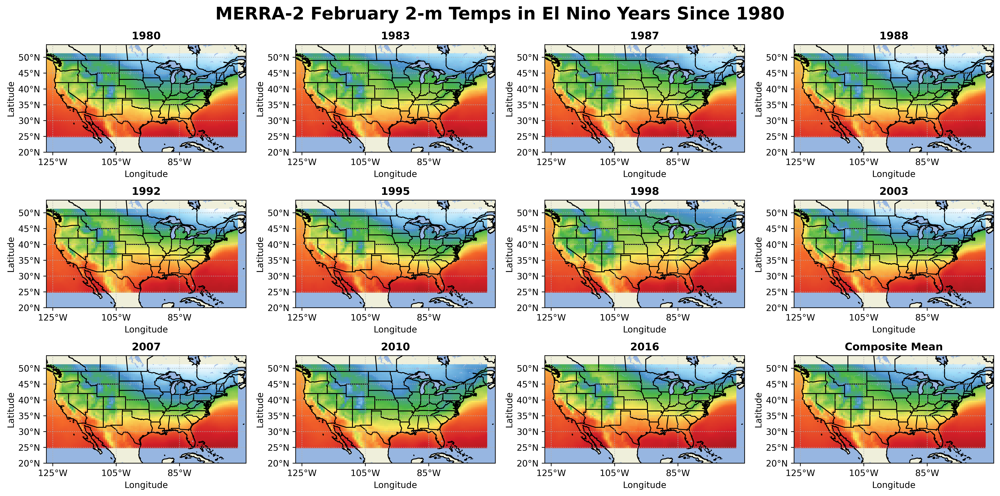

In [8]:
#Generate Figure and Draw Axes using Cartopy Plate Carree Projection
fig, axs = plt.subplots(3,4,figsize=(16,8),subplot_kw={"projection": ccrs.PlateCarree()},
                          dpi=600)

fig.suptitle('MERRA-2 February 2-m Temps in El Nino Years Since 1980',fontsize=20,weight='bold')
#El Nino
for x in range(0,len(El_Nino)):
    subplot_map(El_Nino[x],El_Nino_Years[x],3,4,x,cmaps.WhiteBlueGreenYellowRed,250,300) 
    
#El Nino Composite
subplot_map(El_Nino_comp,"Composite Mean",3,4,x+1,cmaps.WhiteBlueGreenYellowRed,250,300)

plt.tight_layout()

##### A Close Up of the El Nino Composite

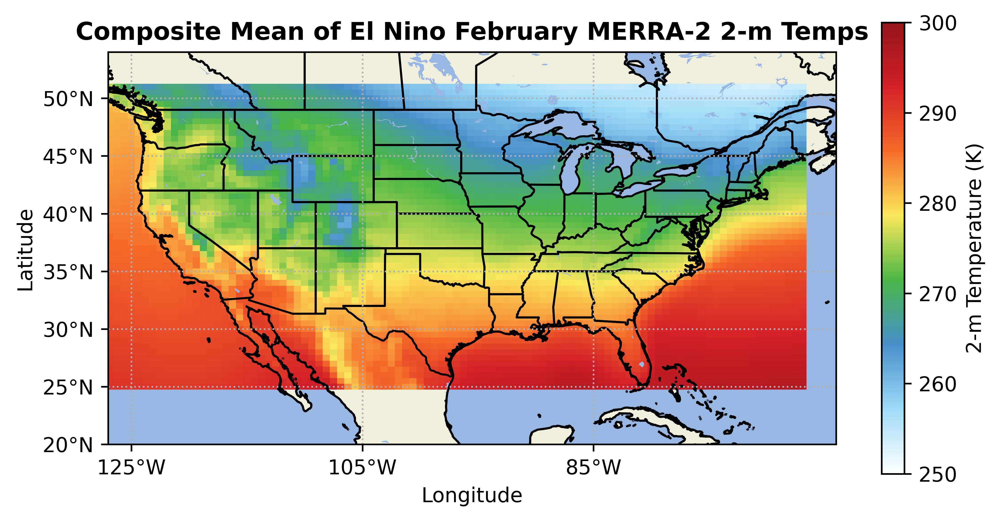

In [9]:
#Generate Figure and Draw Axes using Cartopy Plate Carree Projection
fig, ax1 = plt.subplots(1,1,figsize=(8,4),subplot_kw={"projection": ccrs.PlateCarree()},
                          dpi=600)

grid = subplot_map(El_Nino_comp,"Composite Mean of El Nino February MERRA-2 2-m Temps",1,1,0,cmaps.WhiteBlueGreenYellowRed,250,300)

# Adding a colorbar
cb = plt.colorbar(grid, ax=ax1, orientation = 'vertical', label='2-m Temperature (K)')

##### Plotting all the La Nina Years and the Composite Mean (9-Panel)

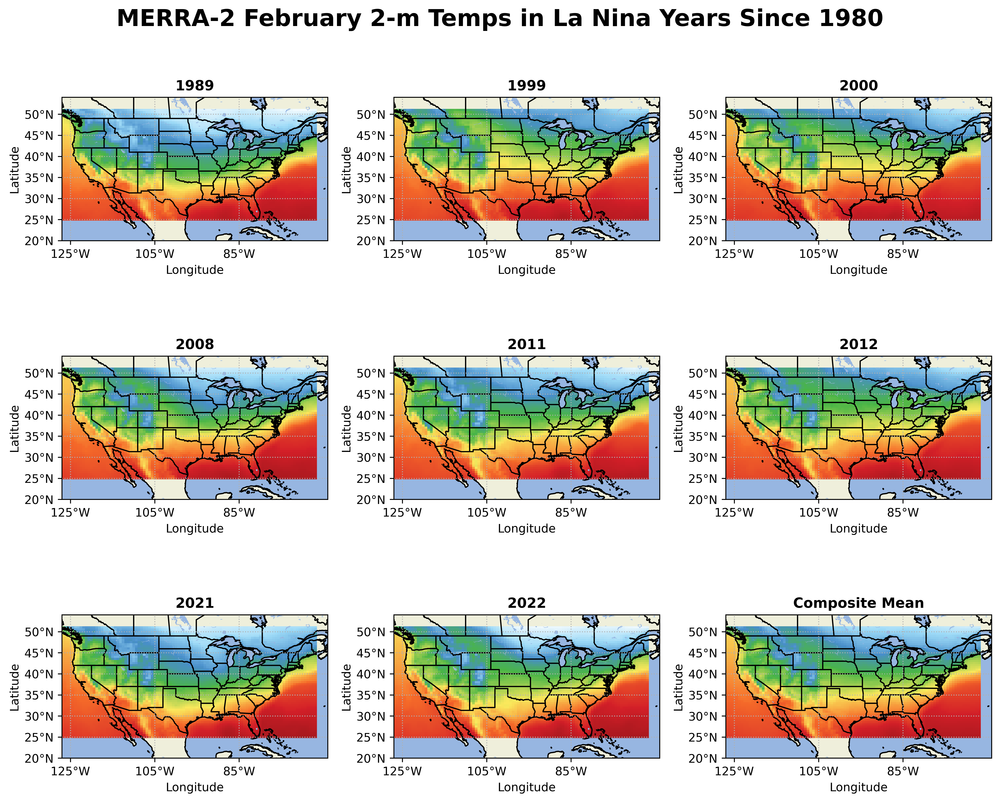

In [10]:
#Generate Figure and Draw Axes using Cartopy Plate Carree Projection
fig, axs = plt.subplots(3,3,figsize=(12,10),subplot_kw={"projection": ccrs.PlateCarree()},
                          dpi=600)

fig.suptitle('MERRA-2 February 2-m Temps in La Nina Years Since 1980',fontsize=20,weight='bold')
#El Nino
for x in range(0,len(La_Nina)):
    subplot_map(La_Nina[x],La_Nina_Years[x],3,3,x,cmaps.WhiteBlueGreenYellowRed,250,300) 
    
#El Nino Composite
subplot_map(La_Nina_comp,"Composite Mean",3,3,x+1,cmaps.WhiteBlueGreenYellowRed,250,300)

plt.tight_layout()

##### A Close Up of the La Nina Composite

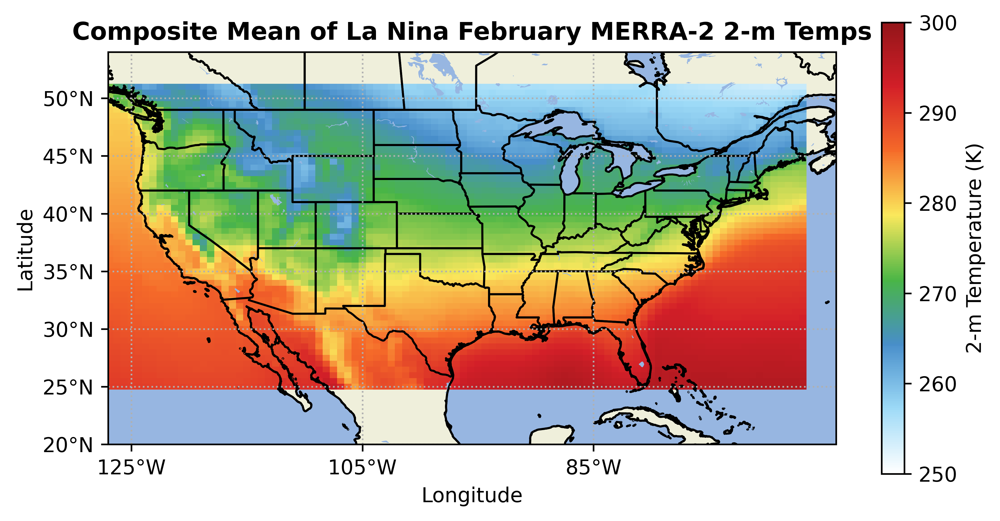

In [11]:
#Generate Figure and Draw Axes using Cartopy Plate Carree Projection
fig, ax1 = plt.subplots(1,1,figsize=(8,4),subplot_kw={"projection": ccrs.PlateCarree()},
                          dpi=600)

grid = subplot_map(La_Nina_comp,"Composite Mean of La Nina February MERRA-2 2-m Temps",1,1,0,cmaps.WhiteBlueGreenYellowRed,250,300)

# Adding a colorbar
cb = plt.colorbar(grid, ax=ax1, orientation = 'vertical', label='2-m Temperature (K)')

##### Now that we've plotted the composites, there are noticable differences in the patterns of temperature across the CONUS between El Nino and La Nina years. However, looking at the temperature anomalies may illustrate a clearer picture on what the temperature differences during these phases of ENSO compared to neutral conditions. 

##### First let's plot the Difference of Composite Means between El Nino and Neutral ENSO years

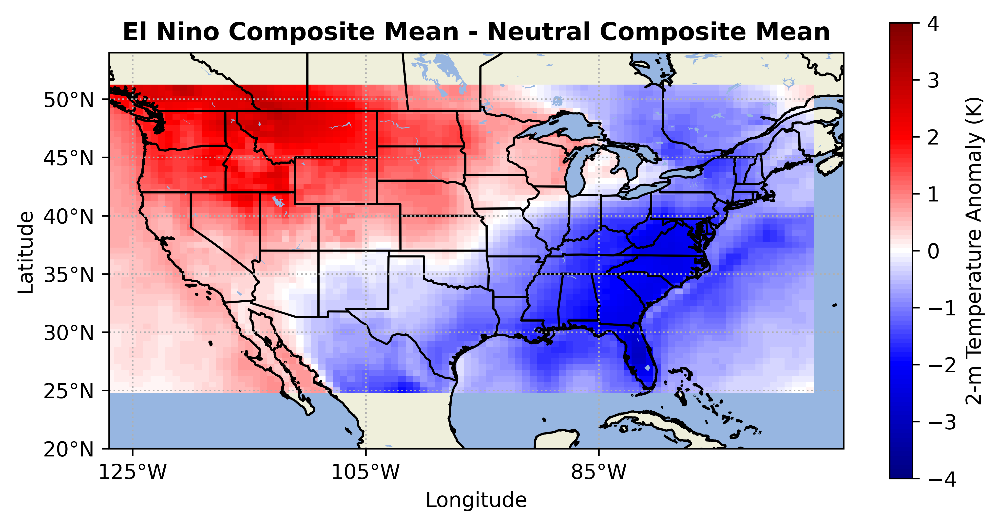

In [12]:
#Plotting (El Nino Composite Mean - Neutral Composite Mean)
fig, ax1 = plt.subplots(1,1,figsize=(8,4),subplot_kw={"projection": ccrs.PlateCarree()},
                          dpi=600)

grid = subplot_map(El_Nino_comp - Neutral_comp,"El Nino Composite Mean - Neutral Composite Mean",
                   1,1,0,cmaps.BlWhRe,-4,4)

# Adding a colorbar
cb = plt.colorbar(grid, ax=ax1, orientation = 'vertical', label='2-m Temperature Anomaly (K)')

##### Finally let's plot the Difference of Composite Means between La Nina and Neutral ENSO years 

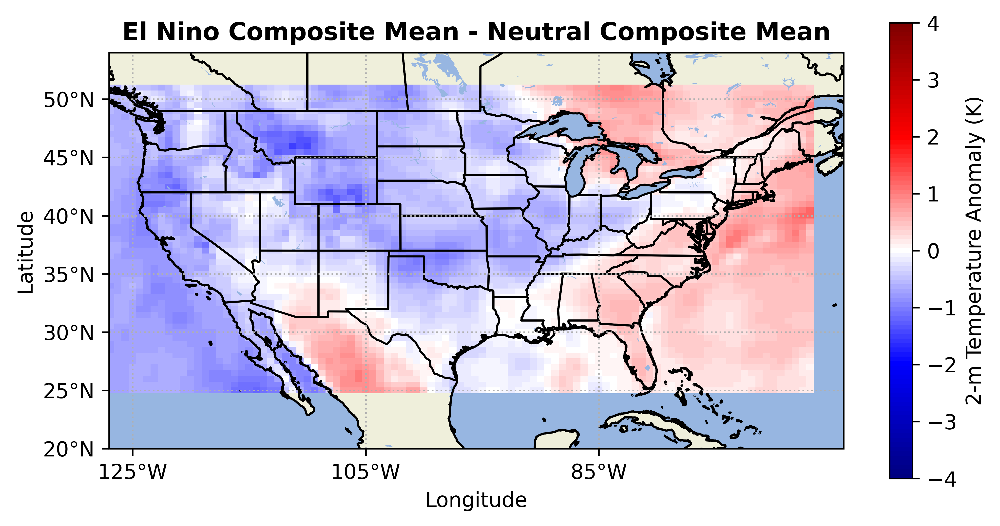

In [13]:
#Plotting (La Nina Composite Mean - Neutral Composite Mean)
fig, ax1 = plt.subplots(1,1,figsize=(8,4),subplot_kw={"projection": ccrs.PlateCarree()},
                          dpi=600)

grid = subplot_map(La_Nina_comp - Neutral_comp,"El Nino Composite Mean - Neutral Composite Mean",
                   1,1,0,cmaps.BlWhRe,-4,4)

# Adding a colorbar
cb = plt.colorbar(grid, ax=ax1, orientation = 'vertical', label='2-m Temperature Anomaly (K)')

#### After plotting the Anomalies we definitely can see the difference between El Nino and La Nina years, seems as El Nino in terms of magnitude of temperature has a greater impact on February surface temperatures across the CONUS. But is it pretty cool to see how temperatures oscillations over the Pacific Ocean have this much of an impact all the way in the CONUS region.

#### Below are images from NOAA for El Nino (top) and La Nina (bottom) and verify that our findings are consistent with the temperature patterns that occur with different phases of ENSO. 

### El Nino

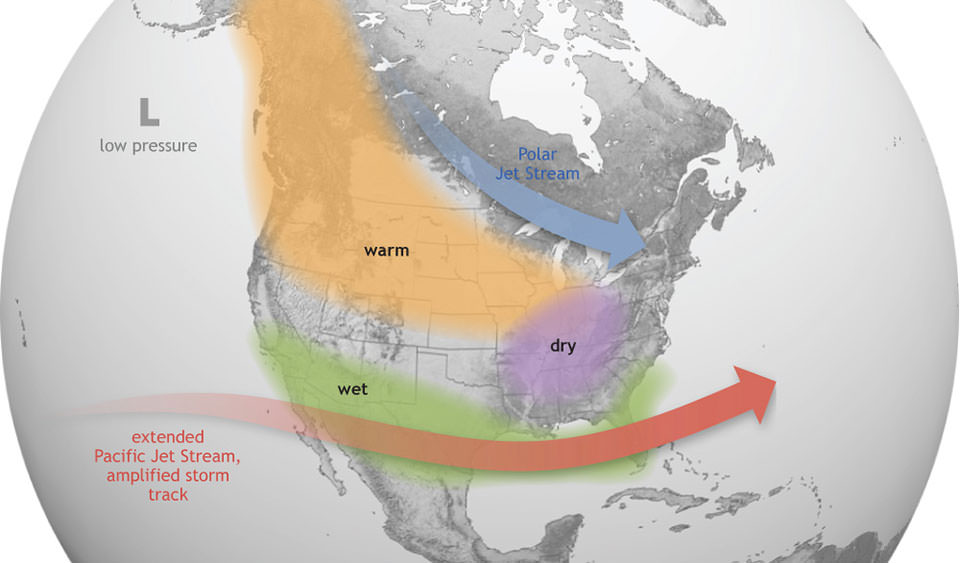

### La Nina
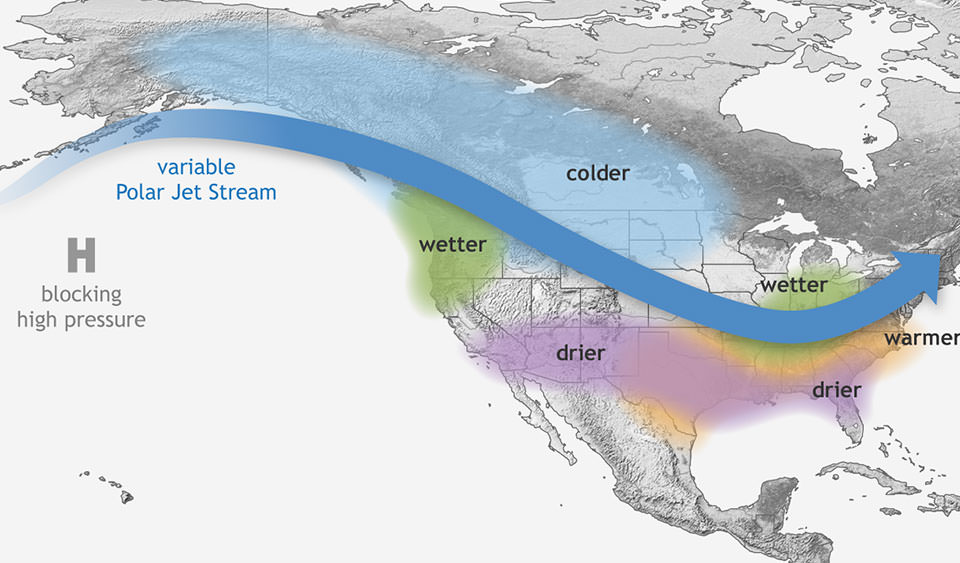

[https://oceanservice.noaa.gov/facts/ninonina.html](https://oceanservice.noaa.gov/facts/ninonina.html)